## INNOMATICS RESEARCH LABS

### NAME : ALMAS BANU

### TASK : EXPLORATORY DATA ANALYSIS

### DATASET : aspiring_minds_employability_outcomes_2015.xlsx
#### About the given dataset
##### ${{\cdot}}$ The given dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO).
##### ${{\cdot}}$ The study is primarily limited  only to students with engineering disciplines.
##### ${{\cdot}}$ The dataset contains the employement outcomes of engineering graduates as Salary, Job Titles, and Job Locations(Dependent variables) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. 
##### ${{\cdot}}$ The dataset  contains  around  40 independent variables and 4000 data points.

#### IMPORTING NECESSARY LIBRARIES

In [1]:
import pandas as pd
import numpy as np 
from collections import Counter
from scipy import stats
import math
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
%matplotlib inline


###### Load the given dataset using pandas library

In [2]:
df = pd.read_excel('dataset/aspiring_minds_employability_outcomes_2015.xlsx')

##### Exploring the given dataset ['Head,Shape and Describe']

In [3]:
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [4]:
df.shape

(3998, 39)

In [5]:
df.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Unnamed: 0             3998 non-null   object        
 1   ID                     3998 non-null   int64         
 2   Salary                 3998 non-null   int64         
 3   DOJ                    3998 non-null   datetime64[ns]
 4   DOL                    3998 non-null   object        
 5   Designation            3998 non-null   object        
 6   JobCity                3998 non-null   object        
 7   Gender                 3998 non-null   object        
 8   DOB                    3998 non-null   datetime64[ns]
 9   10percentage           3998 non-null   float64       
 10  10board                3998 non-null   object        
 11  12graduation           3998 non-null   int64         
 12  12percentage           3998 non-null   float64       
 13  12b

In [7]:
df.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,...,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


In [8]:
df.describe(include='object')

,Unnamed: 0,DOL,Designation,JobCity,Gender,10board,12board,Degree,Specialization,CollegeState
count,3998,3998,3998,3998,3998,3998,3998,3998,3998,3998
unique,1,67,419,339,2,275,340,4,46,26
top,train,present,software engineer,Bangalore,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Uttar Pradesh
freq,3998,1875,539,627,3041,1395,1400,3700,880,915


##### Finding only numerical columns

In [9]:
num = ['int16','int32','int64','float16','float32','float64']
df_numeric = df.select_dtypes(include=num)
print(df_numeric)
len(df_numeric.columns)

          ID   Salary  10percentage  12graduation  12percentage  CollegeID  \
0     203097   420000         84.30          2007         95.80       1141   
1     579905   500000         85.40          2007         85.00       5807   
2     810601   325000         85.00          2010         68.20         64   
3     267447  1100000         85.60          2007         83.60       6920   
4     343523   200000         78.00          2008         76.80      11368   
...      ...      ...           ...           ...           ...        ...   
3993   47916   280000         52.09          2006         55.50       6268   
3994  752781   100000         90.00          2009         93.00       4883   
3995  355888   320000         81.86          2008         65.50       9786   
3996  947111   200000         78.72          2010         69.88        979   
3997  324966   400000         70.60          2008         68.00       6609   

      CollegeTier  collegeGPA  CollegeCityID  CollegeCityTier  

27

##### Checking for Null Values

In [10]:
df.isnull().sum()

Unnamed: 0               0
ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
n

###### There are no NAN values in the given dataset

### Univariate Analysis 

###### Histograms
Useful for visuallising distribution of 1 variable

#### Columns I have  analyzed
ID

Salary

10percentage

12percentage

collegeGPA

Gender

Designation

JobCity

Degree

Specialization

CollegeState

GraduationYear

English

Logical

Quant

ComputerProgramming

ElectronicsAndSemicon

ComputerScience

MechanicalEngg

ElectricalEngg

TelecomEngg

CivilEngg

Histogram of Column :  ID


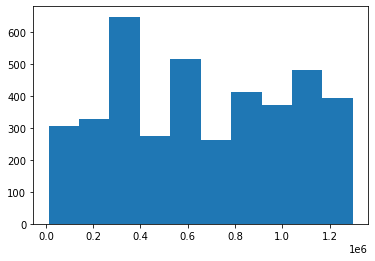


Histogram of Column :  Salary


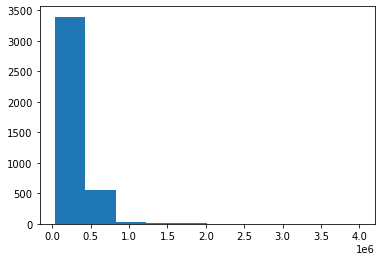


Histogram of Column :  10percentage


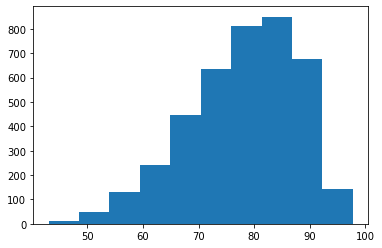


Histogram of Column :  12graduation


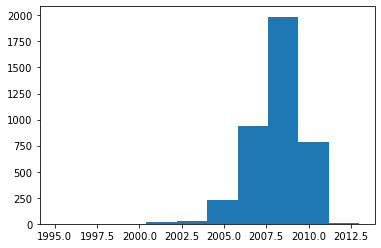


Histogram of Column :  12percentage


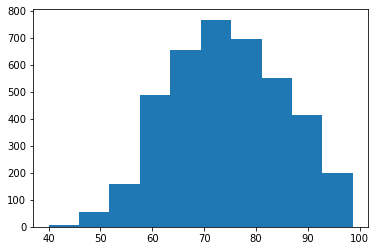


Histogram of Column :  CollegeID


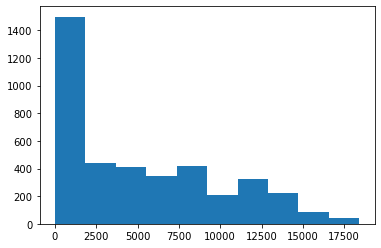


Histogram of Column :  CollegeTier


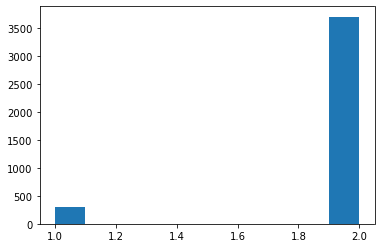


Histogram of Column :  collegeGPA


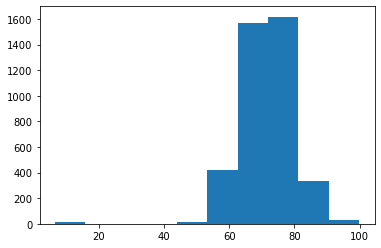


Histogram of Column :  CollegeCityID


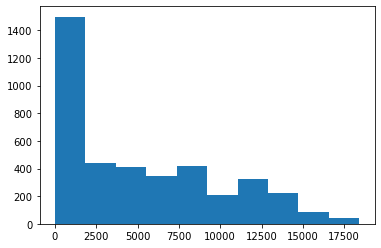


Histogram of Column :  CollegeCityTier


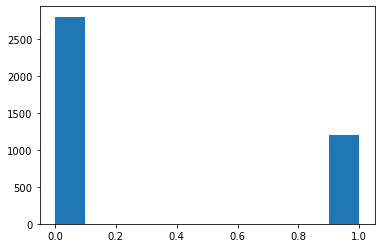


Histogram of Column :  GraduationYear


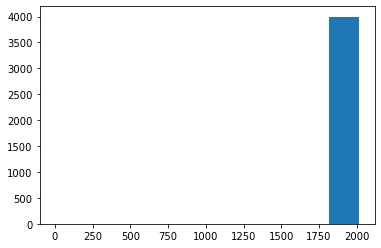


Histogram of Column :  English


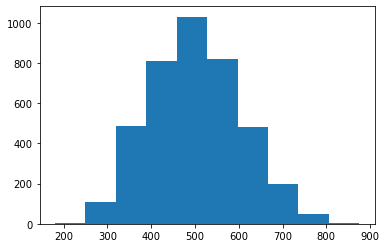


Histogram of Column :  Logical


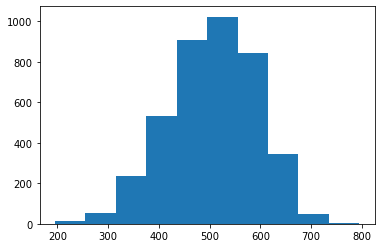


Histogram of Column :  Quant


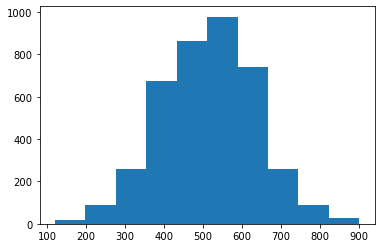


Histogram of Column :  Domain


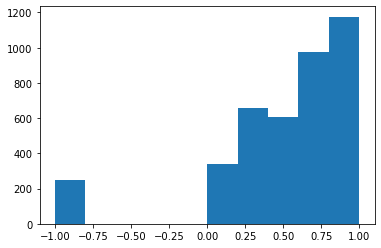


Histogram of Column :  ComputerProgramming


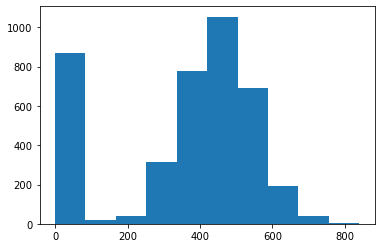


Histogram of Column :  ElectronicsAndSemicon


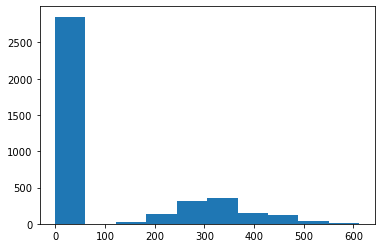


Histogram of Column :  ComputerScience


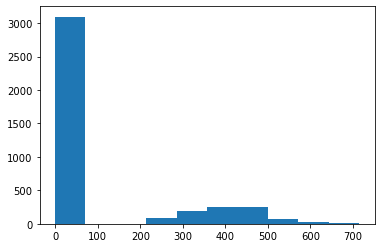


Histogram of Column :  MechanicalEngg


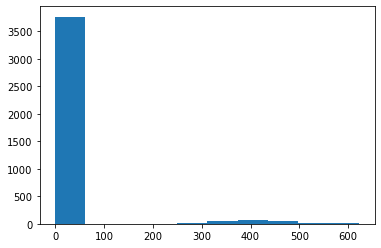


Histogram of Column :  ElectricalEngg


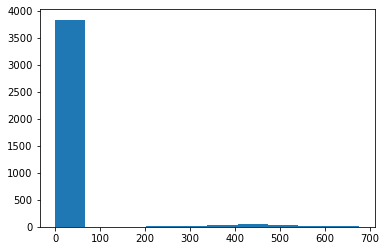


Histogram of Column :  TelecomEngg


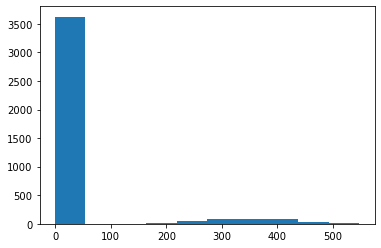


Histogram of Column :  CivilEngg


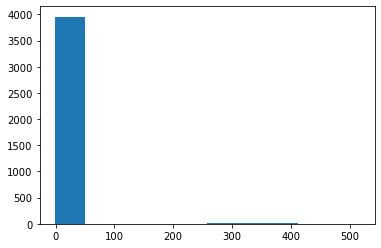


Histogram of Column :  conscientiousness


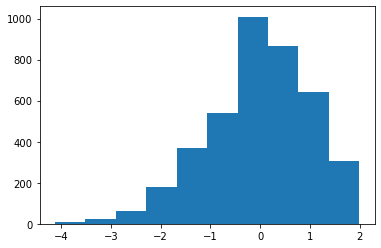


Histogram of Column :  agreeableness


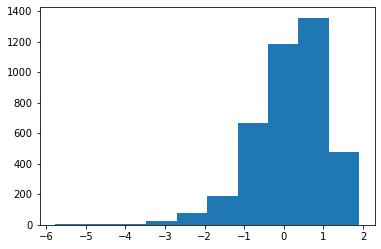


Histogram of Column :  extraversion


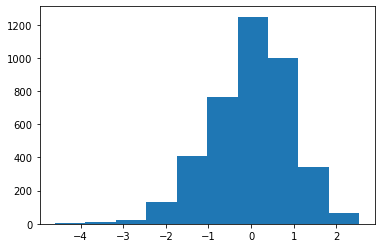


Histogram of Column :  nueroticism


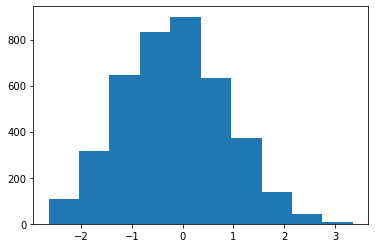


Histogram of Column :  openess_to_experience


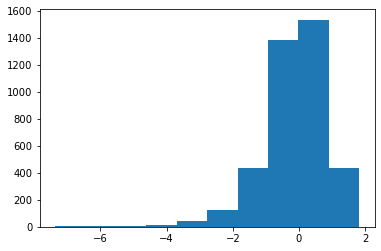

In [11]:
df_numeric = df._get_numeric_data().columns
for col in df[df_numeric]:
    print("Histogram of Column : ",col)
    plt.hist(df[col])
    plt.show()
    print()

##### Outlier detection for each numerical column

In [12]:
numeric_data = df.select_dtypes(['int64','float64','int16','float16','int32','float32']).columns
# Creating a new dataframe
outliers = pd.DataFrame(columns=['Feature','Outliers','Percentage']) 
    
for column in list(numeric_data):  
    # first quartile
    q1 = df[column].quantile(0.25)
    # third quartile
    q3 = df[column].quantile(0.75) 
    # Inter Quantile Range
    iqr = q3 - q1 
        
    lower_value = q1 - (1.5*iqr)        
    upper_value = q3 + (1.5*iqr)
        
    total_outlier = df[(df[column] < lower_value) | (df[column] > upper_value)].shape[0]    
    percent = (total_outlier / len(df[column])) * 100
    outliers = outliers.append({'Feature':column,'Outliers':total_outlier,'Percentage':percent},ignore_index=True)
        
outliers

,Feature,Outliers,Percentage
0,ID,0,0.0
1,Salary,109,2.726363
2,10percentage,30,0.750375
3,12graduation,45,1.125563
4,12percentage,1,0.025013
5,CollegeID,0,0.0
6,CollegeTier,297,7.428714
7,collegeGPA,38,0.950475
8,CollegeCityID,0,0.0
9,CollegeCityTier,0,0.0


###### Finding Outliers in Unnamed: 0 column

###### There are no outliers in this column.It just a column where only train value is present we can remove this column

###### Finding Outliers in ID column

<AxesSubplot:xlabel='ID'>

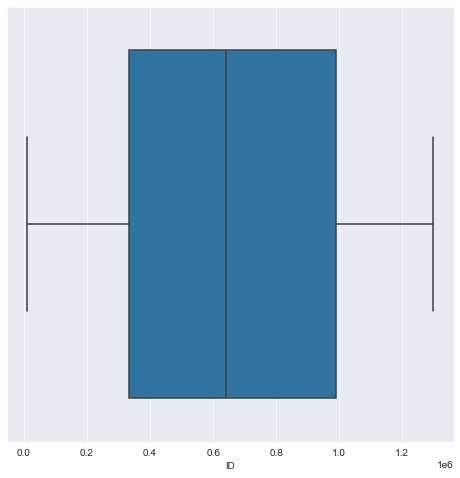

In [13]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['ID'])

###### Observation : There are no outliers

###### Finding Outliers in CollegeID column

<AxesSubplot:xlabel='CollegeID'>

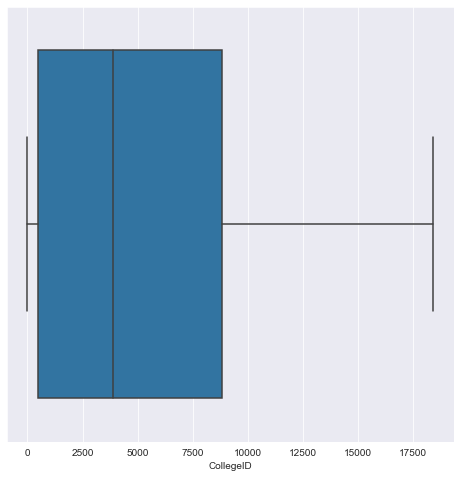

In [14]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['CollegeID'])

###### Observation : There are no outliers

###### Finding Outliers in CollegeCityID column

<AxesSubplot:xlabel='CollegeCityID'>

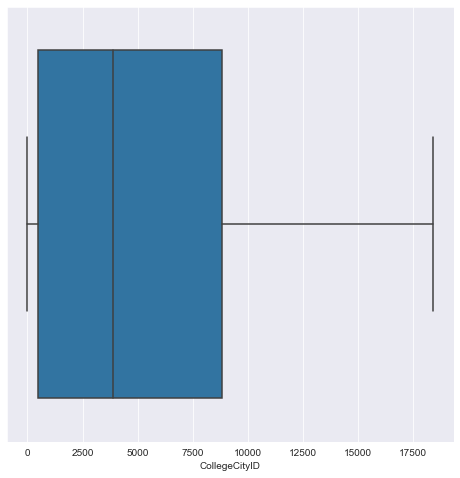

In [15]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['CollegeCityID'])

###### Observation : There are no outliers.

###### Finding Outliers in Salary column

<AxesSubplot:xlabel='Salary'>

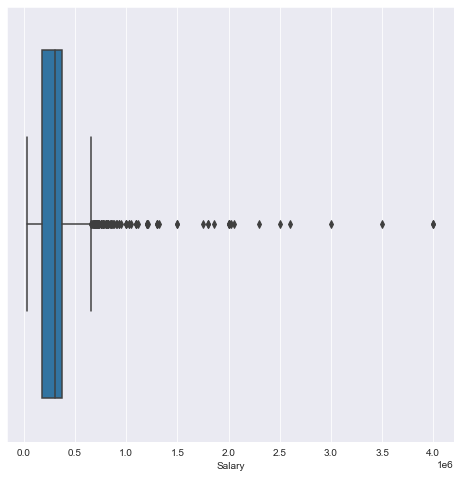

In [16]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['Salary'])

###### Observation : There are some outliers after right whisker of  boxplot But still it is not wrong data because Salary varies from employee to employee.It can't be uniform

In [17]:
#Outliers in Salary column
df['Salary'][df['Salary']>0.6].reset_index()

,index,Salary
0,0,420000
1,1,500000
2,2,325000
3,3,1100000
4,4,200000
...,...,...
3993,3993,280000
3994,3994,100000
3995,3995,320000
3996,3996,200000


###### Finding Outliers in 10percentage column

<AxesSubplot:xlabel='10percentage'>

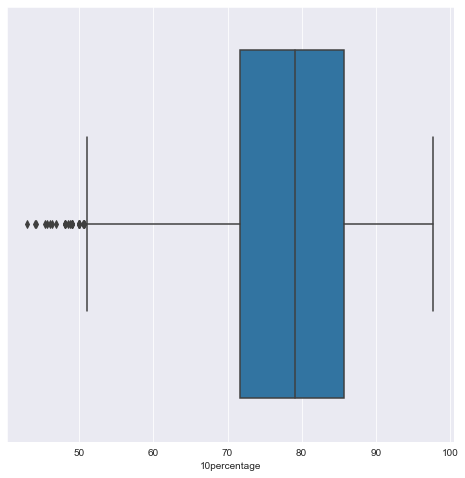

In [18]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['10percentage'])

###### Observation : There are some outliers after left whisker of boxplot

In [19]:
#Outliers in 10percentage column
df['10percentage'][df['10percentage']<52].reset_index()

,index,10percentage
0,108,51.00
1,245,50.60
2,466,44.16
3,490,44.00
4,491,45.60
5,502,48.00
6,600,49.00
7,613,48.00
8,887,51.20
9,898,49.00


##### Finding outliers in 12graduation column 

<AxesSubplot:xlabel='12graduation'>

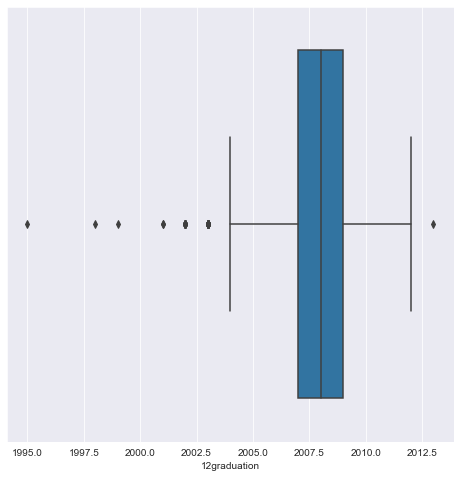

In [20]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['12graduation'])

##### There are only few (countable ) number of outliers.

In [21]:
#Outliers in 12graduation column
df['12graduation'][(df['12graduation']<2003) | (df['12graduation']>2011)].reset_index()

,index,12graduation
0,59,1995
1,103,2012
2,142,2012
3,419,2012
4,578,2012
5,890,2002
6,1083,2001
7,1169,2002
8,1198,2012
9,1212,2012


##### Finding outliers in 12percentage column.

<AxesSubplot:xlabel='12percentage'>

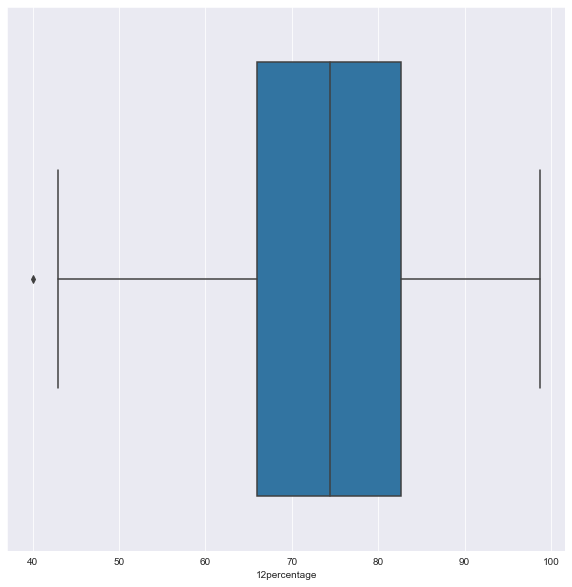

In [22]:
plt.figure(figsize=(10,10))
sns.set_style("darkgrid")
sns.boxplot(df['12percentage'])

###### Observation : There are few outliers.

In [23]:
df['12percentage'][df['12percentage']<44].reset_index()

,index,12percentage
0,23,43.42
1,413,43.12
2,1616,43.00
3,3337,40.00


##### Finding outliers in CollegeTier column.

<AxesSubplot:xlabel='CollegeTier'>

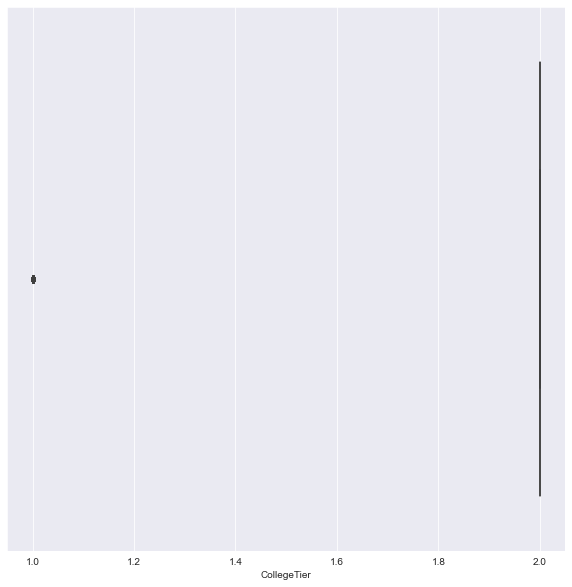

In [24]:
plt.figure(figsize=(10,10))
sns.set_style("darkgrid")
sns.boxplot(df['CollegeTier'])

###### Observation : Boxplot is not forming because the value there is either 1 or 2.

##### Finding outliers in collegeGPA column

<AxesSubplot:xlabel='collegeGPA'>

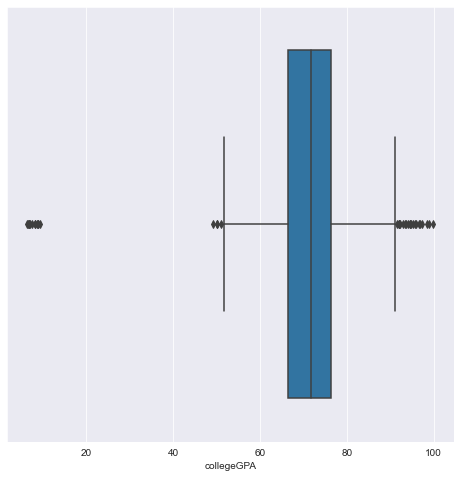

In [25]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['collegeGPA'])

##### Observation : There are some outliers at both ends .

In [26]:
#Outliers in collegeGPA Column.
df['collegeGPA'][(df['collegeGPA']<53) | (df['collegeGPA']>93)].reset_index() 

,index,collegeGPA
0,7,8.58
1,138,6.63
2,324,52.00
3,614,93.60
4,690,99.93
5,788,6.80
6,874,94.50
7,907,50.00
8,968,52.00
9,1134,96.00


##### Finding outliers in English Column

<AxesSubplot:xlabel='English'>

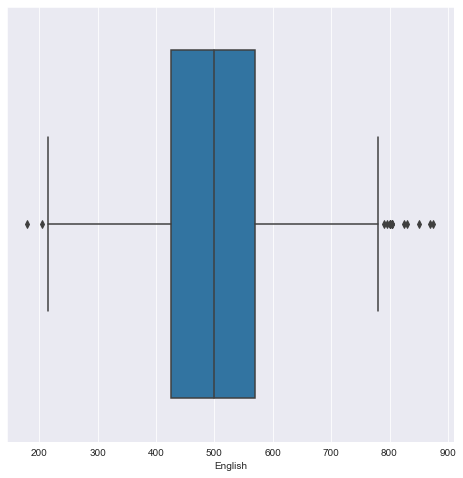

In [27]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['English'])

###### Observation : There are some outliers after right whisker and left whisker.

In [28]:
#Outliers in English column
df['English'][(df['English']<190) | (df['English']>790)].reset_index()

,index,English
0,275,875
1,444,825
2,668,870
3,847,800
4,1183,805
5,1217,180
6,1450,830
7,1519,795
8,2077,800
9,2122,800


##### Finding outliers in Logical column.

<AxesSubplot:xlabel='Logical'>

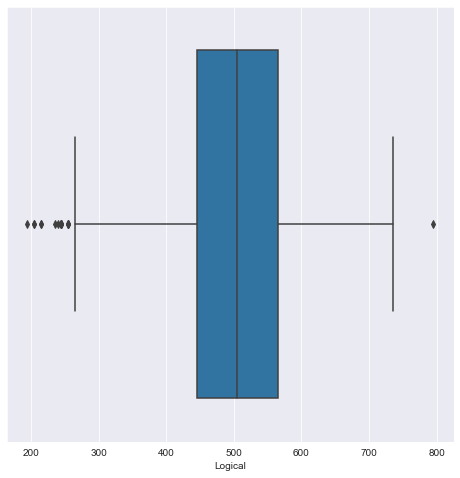

In [29]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['Logical'])

###### Observation : There are some outliers.

In [30]:
#Outliers in Logical column
df['Logical'][(df['Logical']<280) | (df['Logical']>750)].reset_index()

,index,Logical
0,101,255
1,133,205
2,207,245
3,345,215
4,382,274
5,628,215
6,636,275
7,1014,795
8,1160,255
9,1308,270


##### Finding outliers in Quant column.

<AxesSubplot:xlabel='Quant'>

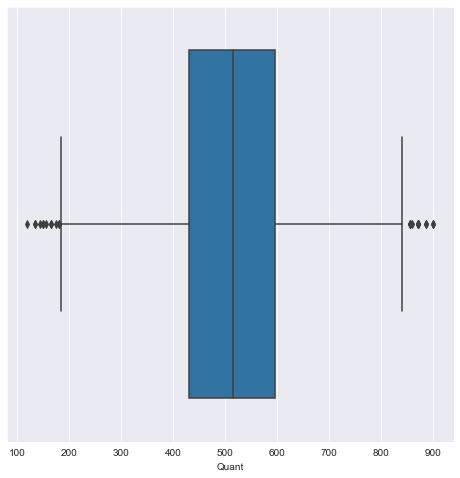

In [31]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['Quant'])

###### Observation : There are some outliers after both whiskers of boxplot.

In [32]:
#Outliers in Quant column
df['Quant'][(df['Quant']<190) | (df['Quant']>810)].reset_index()

,index,Quant
0,42,825
1,195,870
2,230,840
3,522,165
4,564,180
5,651,825
6,698,860
7,783,180
8,899,870
9,1148,175


##### Finding outliers in Domain column.

<AxesSubplot:xlabel='Domain'>

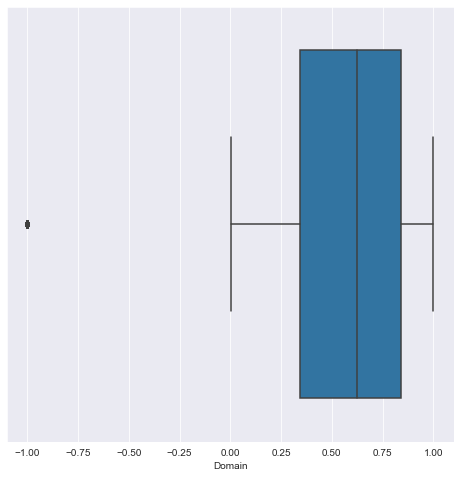

In [33]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['Domain'])

###### Observation : There are few outliers.

In [34]:
#Outliers in Domain column
df['Domain'][df['Domain']<=-1].value_counts().reset_index()

,index,Domain
0,-1.0,246


##### Finding outliers in ComputerProgramming column.

<AxesSubplot:xlabel='ComputerProgramming'>

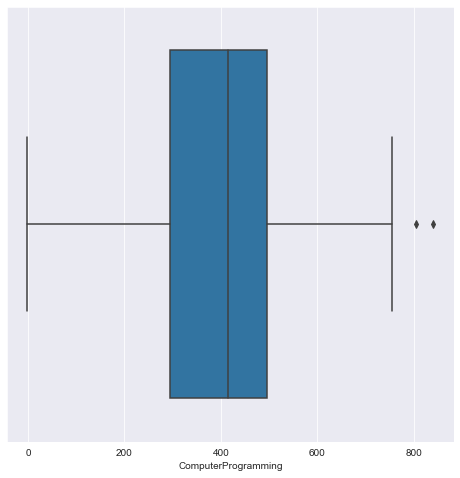

In [35]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['ComputerProgramming'])

###### Observation : There are few outliers.

In [36]:
#Outliers in ComputerProgramming column
df['ComputerProgramming'][df['ComputerProgramming']>800].reset_index()

,index,ComputerProgramming
0,64,804
1,1711,840


##### Finding outliers in ElectronicsAndSemicon column.

<AxesSubplot:xlabel='ElectronicsAndSemicon'>

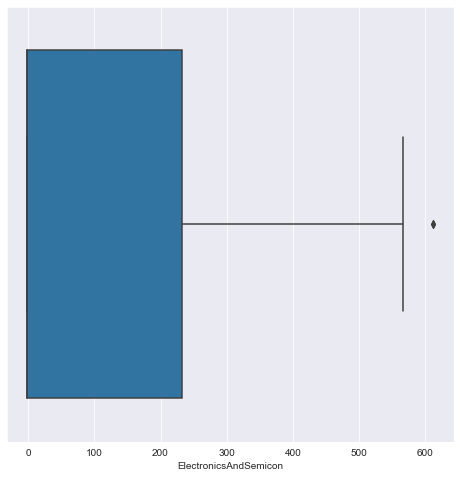

In [37]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['ElectronicsAndSemicon'])

###### Observation : There are few outliers.

In [38]:
#Outliers in ElectronicsAndSemicon column
df['ElectronicsAndSemicon'][df['ElectronicsAndSemicon']>600].reset_index()

,index,ElectronicsAndSemicon
0,1557,612
1,3889,612


##### Finding outliers in ComputerScience column.

<AxesSubplot:xlabel='ComputerScience'>

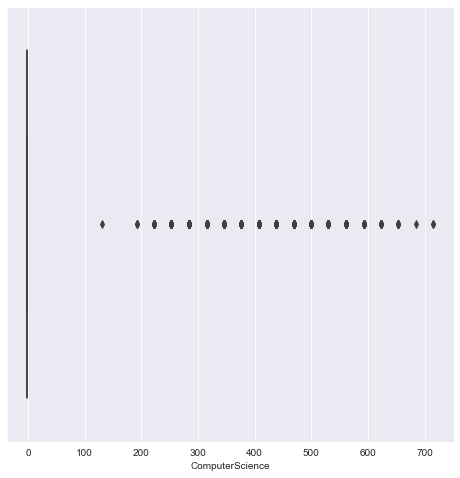

In [39]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['ComputerScience'])

###### Observation : There are many outliers.But here they are values.

In [40]:
#Outliers in ComputerScience column
df['ComputerScience'][df['ComputerScience']>100].reset_index()

,index,ComputerScience
0,5,407
1,6,346
2,14,376
3,17,500
4,24,346
...,...,...
897,3972,407
898,3976,561
899,3981,530
900,3989,346


##### Finding outliers in MechanicalEngg column.

<AxesSubplot:xlabel='MechanicalEngg'>

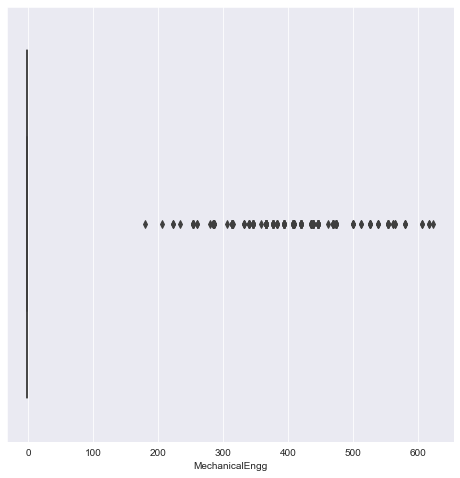

In [41]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['MechanicalEngg'])

###### Observation : There are outliers but these are values.

In [42]:
#Outliers in MechanicalEngg column
df['MechanicalEngg'][df['MechanicalEngg']>160].reset_index()

,index,MechanicalEngg
0,7,469
1,26,313
2,40,286
3,45,253
4,59,366
...,...,...
230,3909,420
231,3916,393
232,3929,383
233,3951,407


##### Finding outliers in ElectricalEngg column.

<AxesSubplot:xlabel='ElectricalEngg'>

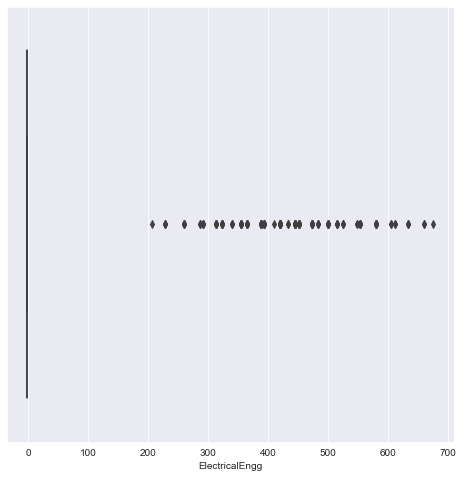

In [43]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['ElectricalEngg'])

###### Observation : There are outliers which are values here.

In [44]:
#Outliers in ElectricalEngg column
df['ElectricalEngg'][df['ElectricalEngg']>200].reset_index()

,index,ElectricalEngg
0,53,484
1,70,606
2,124,393
3,125,500
4,180,553
...,...,...
156,3832,660
157,3835,356
158,3837,366
159,3839,606


##### Finding outliers in TelecomEngg column.

<AxesSubplot:xlabel='TelecomEngg'>

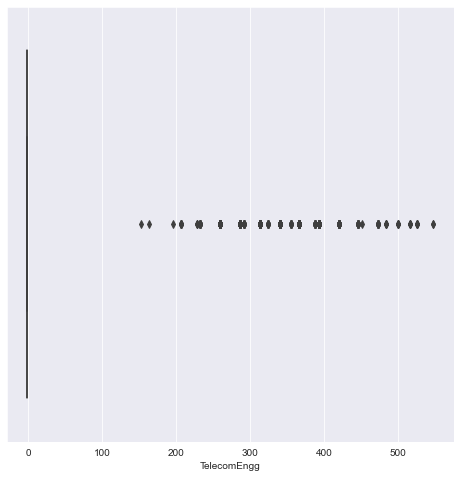

In [45]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['TelecomEngg'])

###### Observation : There are outliers which are values here.

In [46]:
#Outliers in TelecomEngg column
df['TelecomEngg'][df['TelecomEngg']>150].reset_index()

,index,TelecomEngg
0,12,206
1,28,313
2,57,420
3,62,260
4,81,393
...,...,...
369,3937,233
370,3938,340
371,3954,393
372,3990,233


##### Finding outliers in CivilEngg column.

<AxesSubplot:xlabel='CivilEngg'>

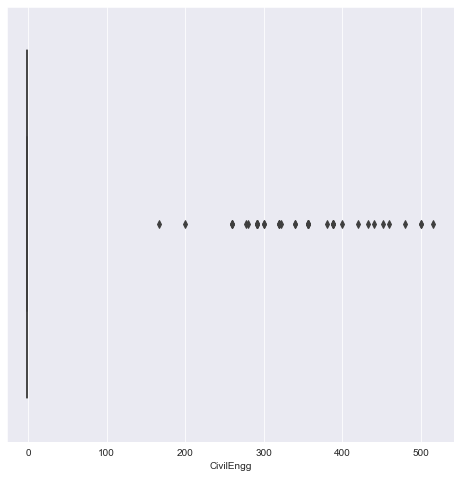

In [47]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['CivilEngg'])

###### Observation : There are outliers which are values here.

In [48]:
#Outliers in CivilEngg column
df['CivilEngg'][df['CivilEngg']>160].reset_index()

,index,CivilEngg
0,26,320
1,59,400
2,172,388
3,211,320
4,222,260
5,331,440
6,403,356
7,453,356
8,492,292
9,493,500


##### Finding outliers in conscientiousness column.

<AxesSubplot:xlabel='conscientiousness'>

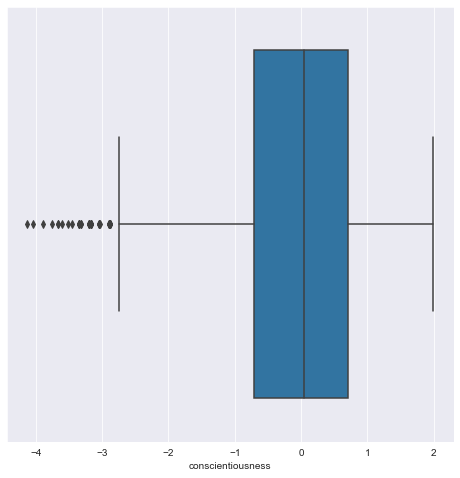

In [49]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['conscientiousness'])

###### Observation : There are some outliers after left whisker.

In [50]:
#Outliers in conscientiousness column
df['conscientiousness'][df['conscientiousness']<-2.6].reset_index()

,index,conscientiousness
0,29,-3.1994
1,159,-2.8879
2,210,-3.1994
3,214,-2.7443
4,315,-3.6631
5,335,-3.6060
6,373,-3.3539
7,382,-3.3539
8,408,-3.3188
9,468,-2.8879


##### Finding outliers in agreeableness column.

<AxesSubplot:xlabel='agreeableness'>

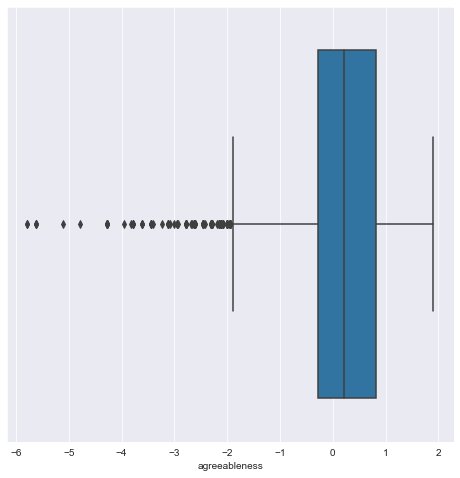

In [51]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['agreeableness'])

###### Observation : There are some outliers after left whisker.

In [52]:
#Outliers in agreeableness column
df['agreeableness'][df['agreeableness']<-1.9].reset_index()

,index,agreeableness
0,23,-2.1186
1,43,-2.4516
2,63,-2.6847
3,67,-3.7836
4,157,-2.1186
...,...,...
118,3843,-2.1186
119,3855,-2.3073
120,3878,-2.4516
121,3939,-1.9521


##### Finding outliers in extraversion column.

<AxesSubplot:xlabel='extraversion'>

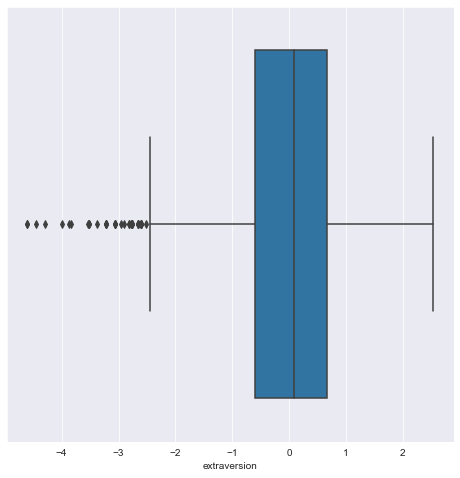

In [53]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['extraversion'])

###### Observation : There are some outliers after left whisker.

In [54]:
#Outliers in extraversion column
df['extraversion'][df['extraversion']<-2.5].reset_index()

,index,extraversion
0,63,-2.6028
1,159,-3.2176
2,335,-4.6009
3,408,-3.5250
4,523,-3.0639
5,666,-3.2176
6,726,-2.7750
7,1169,-2.6662
8,1211,-4.6009
9,1217,-2.6028


##### Finding outliers in nueroticism column.

<AxesSubplot:xlabel='nueroticism'>

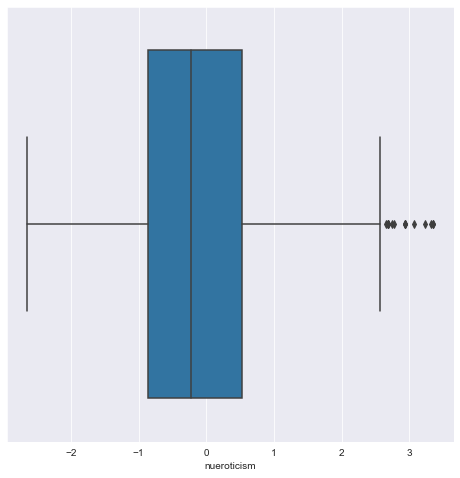

In [55]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['nueroticism'])

###### Observation : There are some outliers after right whisker.

In [56]:
#Outliers in nueroticism column
df['nueroticism'][df['nueroticism']>2.5].reset_index()

,index,nueroticism
0,222,2.6475
1,405,2.9349
2,634,2.5300
3,1151,3.3525
4,1191,3.3525
5,1383,3.2350
6,1602,2.6814
7,1843,3.0617
8,2054,2.7650
9,2234,2.7356


##### Finding outliers in openess_to_experience column.

<AxesSubplot:xlabel='openess_to_experience'>

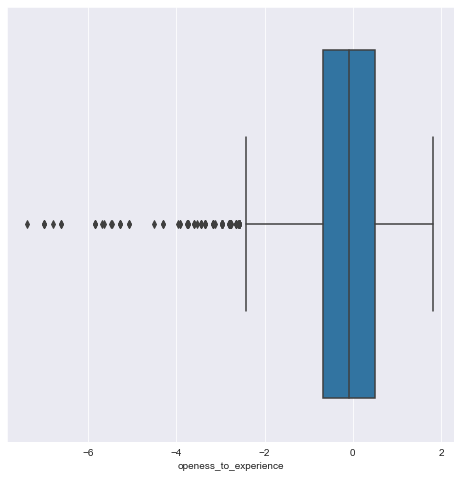

In [57]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(df['openess_to_experience'])

###### Observation : There are some outliers after left whisker.

In [58]:
#Outliers in openess_to_experience column
df['openess_to_experience'][df['openess_to_experience']<-2.1].reset_index()

,index,openess_to_experience
0,22,-2.7769
1,23,-5.0763
2,43,-3.1602
3,63,-5.4770
4,70,-2.3937
...,...,...
137,3913,-2.2021
138,3918,-2.9686
139,3923,-2.2021
140,3957,-2.9731


#### PDF Distributions of Columns

##### Function for Distributions

In [59]:
def vis(col):
    sns.set_style("darkgrid")
    plt.figure(figsize=(10,6))
    plt.subplot(1, 2, 1)
    sns.distplot(df[col])
    plt.axvline(df[col].mean(), color="red", label="Mean")
    plt.legend(shadow=True,fontsize="larger")
    plt.subplot(1, 2, 2)
    sns.histplot(df[col])
    plt.axvline(df[col].mean(), color="black", label="Mean")
    plt.legend(shadow=True,fontsize="larger")

    skew = df[col].skew()
    kurt = df[col].kurt()
    print('Skewness:{}'.format(round(skew,3)))
    print('Kurtosis:{}'.format(round(kurt,3)))

##### PDF distribution of Salary Column

Skewness:6.451
Kurtosis:80.93


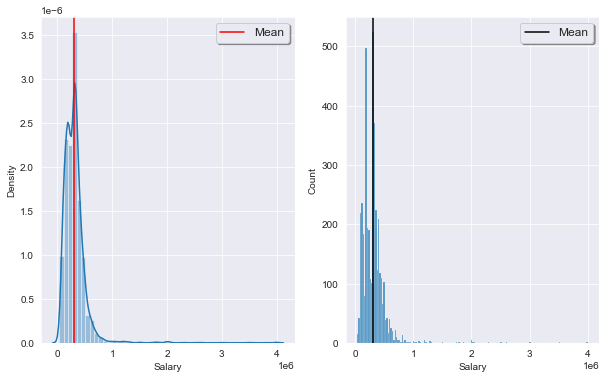

In [60]:
vis('Salary')

###### Observation : As we can see there is a long tail towards right so it may be log normal distribution. 

##### PDF distribution of 10percentage Column

Skewness:-0.591
Kurtosis:-0.11


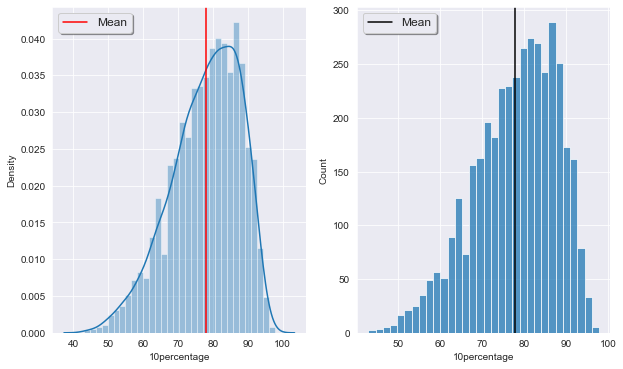

In [61]:
vis('10percentage')

###### Observation : As we can see a left tail is thick it looks like negatively skewed distribution.

##### PDF distribution of 12percentage Column

Skewness:-0.033
Kurtosis:-0.631


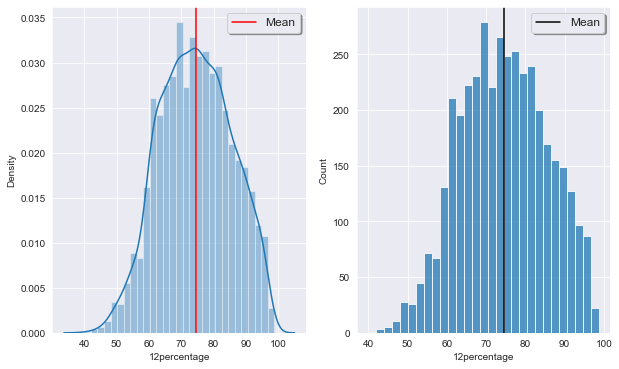

In [62]:
vis('12percentage')

###### Observation : Same as 10percentage Column negatively skewed distribution

##### PDF distribution of collegeGPA Column

Skewness:-1.249
Kurtosis:10.234


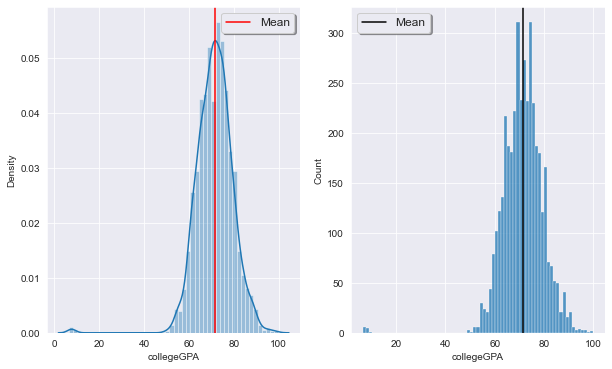

In [63]:
vis('collegeGPA')

###### Observation : As we can see a long left tail it can be heavily negatively skewed distribution.

##### PDF distribution of Domain Column

Skewness:-1.922
Kurtosis:3.896


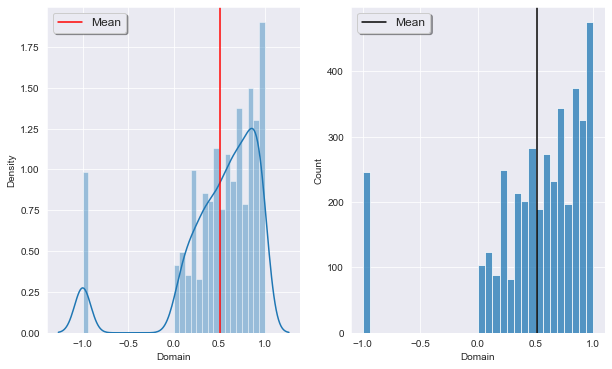

In [65]:
sns.set_style("darkgrid")
vis('Domain')

###### Observation : The plot is having two major peaks we can't say about distribution

##### PDF distribution of ID Column

Skewness:0.055
Kurtosis:-1.223


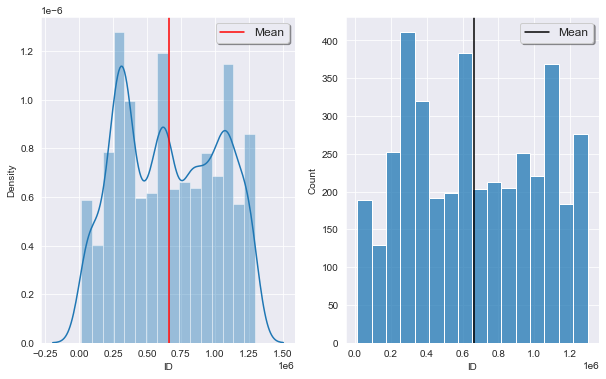

In [66]:
vis('ID')

###### Observation : The plot is having 3 peaks but whole data is concentrated about centre.

##### PDF distribution of ComputerProgramming Column

Skewness:-0.778
Kurtosis:-0.666


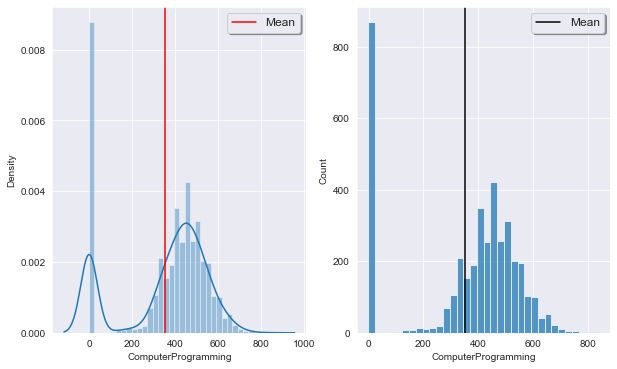

In [67]:
vis('ComputerProgramming')

###### Observation : The plot is having 2 peaks.

##### PDF distribution of ComputerScience Column

Skewness:1.53
Kurtosis:0.693


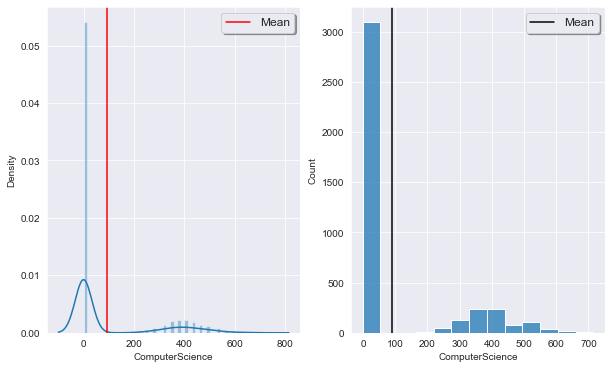

In [68]:
vis('ComputerScience')

###### Observation : The plot is having 1 peak but not centrally concentrated.

##### PDF distribution of ElectronicsAndSemicon Column

Skewness:1.196
Kurtosis:-0.21


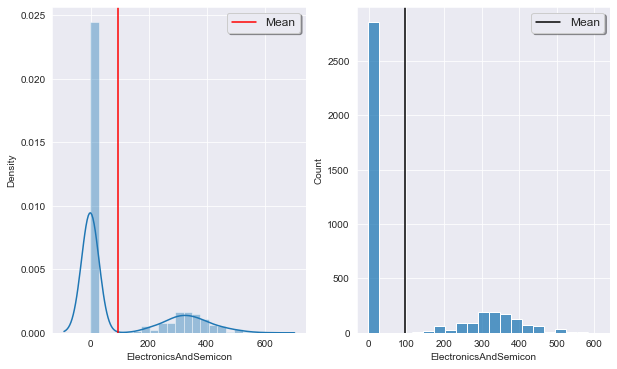

In [69]:
vis('ElectronicsAndSemicon')

##### PDF distribution of ElectricalEngg Column

Skewness:5.06
Kurtosis:24.878


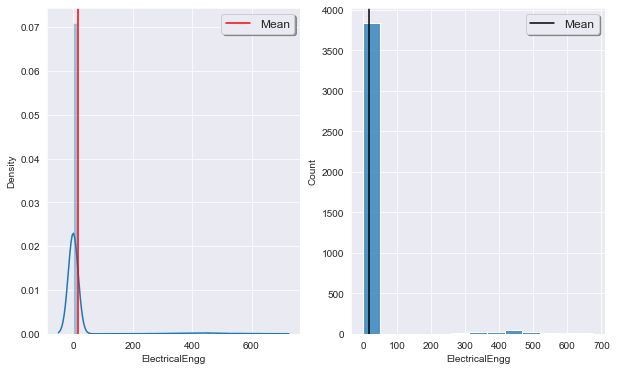

In [70]:
vis('ElectricalEngg')

##### Categorical Columns

#### Frequency Distribution of "Designation" Column

In [71]:
df['Designation']

0           senior quality engineer
1                 assistant manager
2                  systems engineer
3          senior software engineer
4                               get
                   ...             
3993              software engineer
3994               technical writer
3995    associate software engineer
3996             software developer
3997        senior systems engineer
Name: Designation, Length: 3998, dtype: object

In [72]:
u_designation = df['Designation'].unique()
len(u_designation)

419

In [73]:
count_design = df['Designation'].value_counts()
count_design

software engineer                    539
software developer                   265
system engineer                      205
programmer analyst                   139
systems engineer                     118
                                    ... 
cad drafter                            1
noc engineer                           1
human resources intern                 1
senior quality assurance engineer      1
jr. software developer                 1
Name: Designation, Length: 419, dtype: int64

##### Taking the most frequent designation which is occuring

In [74]:
count_design[:20]

software engineer             539
software developer            265
system engineer               205
programmer analyst            139
systems engineer              118
java software engineer        111
software test engineer        100
project engineer               77
technical support engineer     76
senior software engineer       72
java developer                 67
test engineer                  57
web developer                  54
application developer          52
assistant manager              52
network engineer               51
data analyst                   49
business analyst               49
engineer                       47
android developer              46
Name: Designation, dtype: int64

Text(0.5, 1.0, 'Frequency Distribution of Designation Column')

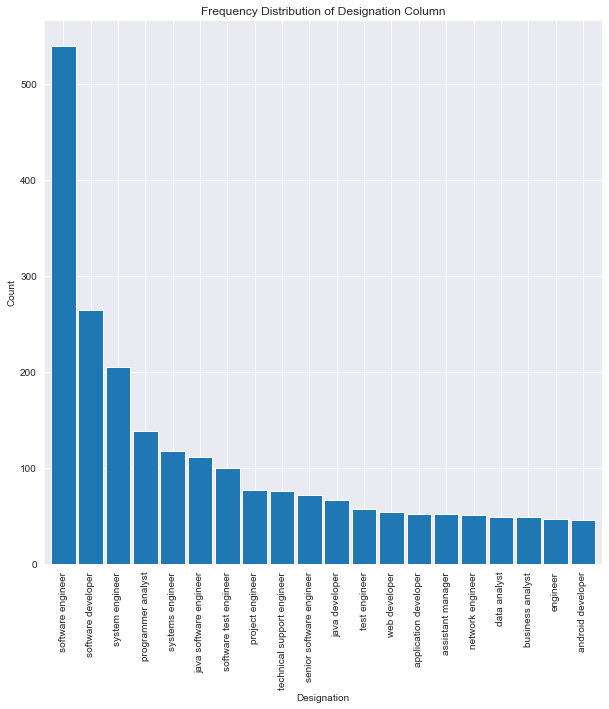

In [75]:
sns.set_style('darkgrid')
plt.figure(figsize=(10,10))
count_design[:20].plot(kind='bar',width=0.9)
plt.xlabel('Designation')
plt.ylabel('Count')
plt.title('Frequency Distribution of Designation Column')

###### Observation : From the plot we can see that most of the candidates has Software engineer as their Designation and Software developer in the second place.

#### Frequency Distribution of "JobCity" Column

In [76]:
df["JobCity"]

0              Bangalore
1                 Indore
2                Chennai
3                Gurgaon
4                Manesar
              ...       
3993          New Delhi 
3994           Hyderabad
3995           Bangalore
3996    Asifabadbanglore
3997             Chennai
Name: JobCity, Length: 3998, dtype: object

In [77]:
u_jobcity = df['JobCity'].unique()
len(u_jobcity)

339

In [78]:
count_jobcity = df['JobCity'].value_counts()
count_jobcity

Bangalore           627
-1                  461
Noida               368
Hyderabad           335
Pune                290
                   ... 
Tirunelvelli          1
Ernakulam             1
Nanded                1
Dharmapuri            1
Asifabadbanglore      1
Name: JobCity, Length: 339, dtype: int64

###### Observation : Is there a city named "-1" ? No,It might be wrong data so we can drop this -1 city. 

In [79]:
df['JobCity'].replace(-1,np.nan,inplace=True)
df['JobCity'].dropna()

0              Bangalore
1                 Indore
2                Chennai
3                Gurgaon
4                Manesar
              ...       
3993          New Delhi 
3994           Hyderabad
3995           Bangalore
3996    Asifabadbanglore
3997             Chennai
Name: JobCity, Length: 3537, dtype: object

In [80]:
#New count since one value is dropped
count_jobcity = df['JobCity'].value_counts()
count_jobcity

Bangalore           627
Noida               368
Hyderabad           335
Pune                290
Chennai             272
                   ... 
Asansol               1
Tirunelvelli          1
Ernakulam             1
Nanded                1
Asifabadbanglore      1
Name: JobCity, Length: 338, dtype: int64

##### Taking the most frequent jobcity occuring

In [81]:
count_design[:15]

software engineer             539
software developer            265
system engineer               205
programmer analyst            139
systems engineer              118
java software engineer        111
software test engineer        100
project engineer               77
technical support engineer     76
senior software engineer       72
java developer                 67
test engineer                  57
web developer                  54
application developer          52
assistant manager              52
Name: Designation, dtype: int64

Text(0.5, 1.0, 'Frequency Distribution of JobCity Column')

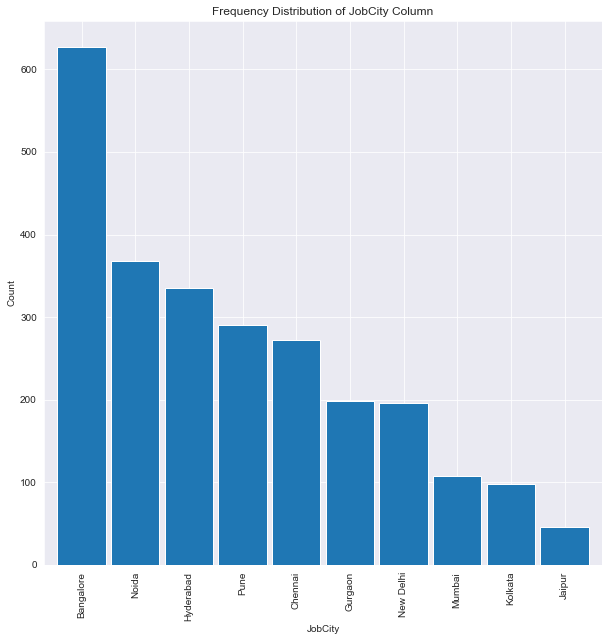

In [82]:
sns.set_style('darkgrid')
plt.figure(figsize=(10,10))
count_jobcity[:10].plot(kind='bar',width=0.9)
plt.xlabel('JobCity')
plt.ylabel('Count')
plt.title('Frequency Distribution of JobCity Column')

###### Observation : From the plot we can see that most of the candidates are placed in  Bangalore city and Noida in the second place.

#### Frequency Distribution of "Degree" Column

In [83]:
df['Degree']

0       B.Tech/B.E.
1       B.Tech/B.E.
2       B.Tech/B.E.
3       B.Tech/B.E.
4       B.Tech/B.E.
           ...     
3993    B.Tech/B.E.
3994    B.Tech/B.E.
3995    B.Tech/B.E.
3996    B.Tech/B.E.
3997    B.Tech/B.E.
Name: Degree, Length: 3998, dtype: object

In [84]:
u_degree = df['Degree'].unique()
len(u_degree)

4

In [85]:
count_degree = df['Degree'].value_counts()
count_degree

B.Tech/B.E.      3700
MCA               243
M.Tech./M.E.       53
M.Sc. (Tech.)       2
Name: Degree, dtype: int64

##### Since there are only 4 degree type we can plot them only .

Text(0.5, 1.0, 'Frequency Distribution of Degree Column')

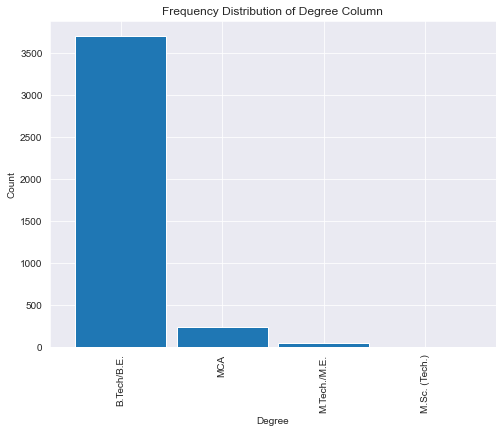

In [86]:
sns.set_style('darkgrid')
plt.figure(figsize=(8,6))
count_degree.plot(kind='bar',width=0.9)
plt.xlabel('Degree')
plt.ylabel('Count')
plt.title('Frequency Distribution of Degree Column')

###### Observation : B Tech/B E graduates are in larger number(>80%)  and MCA graduates are in second place.

#### Frequency Distribution of "Specialization" Column

In [87]:
df['Specialization']

0                            computer engineering
1       electronics and communication engineering
2                          information technology
3                            computer engineering
4       electronics and communication engineering
                          ...                    
3993                       information technology
3994    electronics and communication engineering
3995                         computer engineering
3996               computer science & engineering
3997                       information technology
Name: Specialization, Length: 3998, dtype: object

In [88]:
u_specialize = df['Specialization'].unique()
len(u_specialize)

46

In [89]:
count_special = df['Specialization'].value_counts()
count_special

electronics and communication engineering      880
computer science & engineering                 744
information technology                         660
computer engineering                           600
computer application                           244
mechanical engineering                         201
electronics and electrical engineering         196
electronics & telecommunications               121
electrical engineering                          82
electronics & instrumentation eng               32
civil engineering                               29
electronics and instrumentation engineering     27
information science engineering                 27
instrumentation and control engineering         20
electronics engineering                         19
biotechnology                                   15
other                                           13
industrial & production engineering             10
applied electronics and instrumentation          9
chemical engineering           

##### Taking the most frequent Specialization occuring

In [90]:
count_special[:5]

electronics and communication engineering    880
computer science & engineering               744
information technology                       660
computer engineering                         600
computer application                         244
Name: Specialization, dtype: int64

Text(0.5, 1.0, 'Frequency Distribution of Specialization Column')

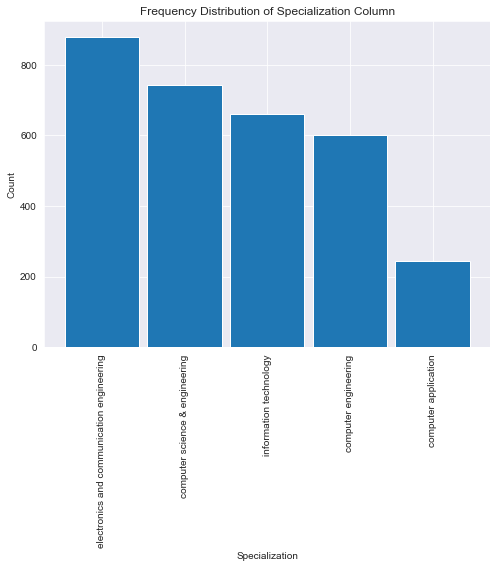

In [91]:
sns.set_style('darkgrid')
plt.figure(figsize=(8,6))
count_special[:5].plot(kind='bar',width=0.9)
plt.xlabel('Specialization')
plt.ylabel('Count')
plt.title('Frequency Distribution of Specialization Column')

###### Observation : Most choosed Specialization is electronics and communication engineering . Second is computer science and engineering.

#### Frequency Distribution of "CollegeState" Column

In [92]:
df['CollegeState']

0       Andhra Pradesh
1       Madhya Pradesh
2        Uttar Pradesh
3                Delhi
4        Uttar Pradesh
             ...      
3993           Haryana
3994         Telangana
3995            Orissa
3996         Karnataka
3997        Tamil Nadu
Name: CollegeState, Length: 3998, dtype: object

In [93]:
u_colstate = df['CollegeState'].unique()
len(u_colstate)

26

In [94]:
count_colstate = df['CollegeState'].value_counts()
count_colstate

Uttar Pradesh        915
Karnataka            370
Tamil Nadu           367
Telangana            319
Maharashtra          262
Andhra Pradesh       225
West Bengal          196
Punjab               193
Madhya Pradesh       189
Haryana              180
Rajasthan            174
Orissa               172
Delhi                162
Uttarakhand          113
Kerala                33
Jharkhand             28
Chhattisgarh          27
Gujarat               24
Himachal Pradesh      16
Bihar                 10
Jammu and Kashmir      7
Assam                  5
Union Territory        5
Sikkim                 3
Meghalaya              2
Goa                    1
Name: CollegeState, dtype: int64

##### Taking the most frequent CollegeState occuring

In [95]:
count_colstate[:10]

Uttar Pradesh     915
Karnataka         370
Tamil Nadu        367
Telangana         319
Maharashtra       262
Andhra Pradesh    225
West Bengal       196
Punjab            193
Madhya Pradesh    189
Haryana           180
Name: CollegeState, dtype: int64

Text(0.5, 1.0, 'Frequency Distribution of CollegeState Column')

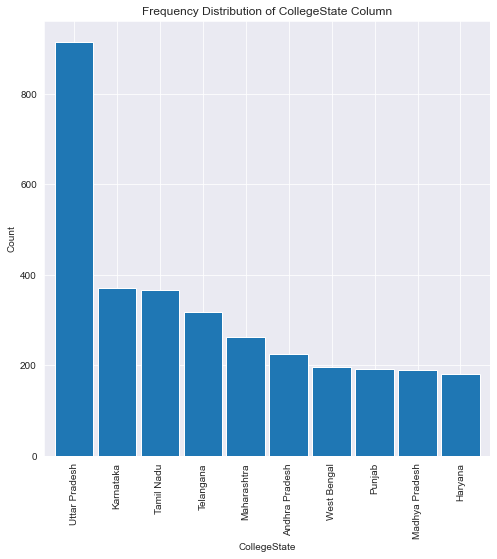

In [96]:
sns.set_style('darkgrid')
plt.figure(figsize=(8,8))
count_colstate[:10].plot(kind='bar',width=0.9)
plt.xlabel('CollegeState')
plt.ylabel('Count')
plt.title('Frequency Distribution of CollegeState Column')

###### Observation : State of College which is most choosen by candidate is Uttar Pradesh.Second is Karnataka.

###### CountPlot of Males and Females i.e 'Gender' Column

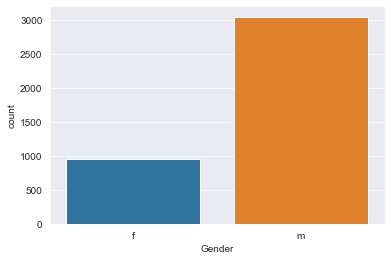

In [97]:
sns.countplot(x ='Gender', data = df)
plt.show()

###### Observation : Male employees are more than Females

##### Employement of males and females based on Graduation Year

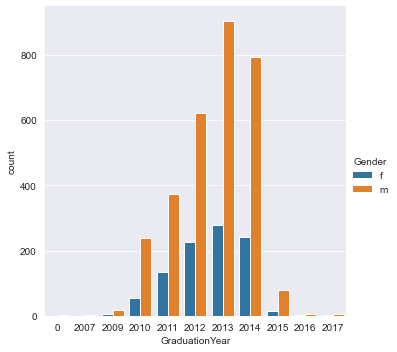

In [98]:
sns.catplot(x = "GraduationYear", hue = "Gender", data = df, kind = 'count')
plt.show()

###### Observation : As we observed before Male employees are more than female this above graph also implies that. In 2013, joining of employees is highest. In second position we can see that 2014 and in last position we have 2017. 

#### Bivariate Analysis

##### Correlation between features using corr() function

In [99]:
df.corr()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
ID,1.000000,-0.247294,0.044547,0.673102,0.007069,0.284540,0.035160,0.047144,0.284540,-0.035977,...,0.482626,-0.026147,0.104454,-0.049272,-0.017871,0.175557,0.024837,0.120979,-0.146289,0.031359
Salary,-0.247294,1.000000,0.177373,-0.161383,0.170254,-0.118690,-0.179332,0.130103,-0.118690,0.015384,...,-0.100720,0.018475,-0.047598,-0.022691,0.037639,-0.064148,0.057423,-0.010213,-0.054685,-0.011312
10percentage,0.044547,0.177373,1.000000,0.269957,0.643378,0.021082,-0.126042,0.312538,0.021082,0.116707,...,-0.018933,0.050364,0.074419,0.049378,0.030002,0.067657,0.136645,-0.004679,-0.132496,0.036692
12graduation,0.673102,-0.161383,0.269957,1.000000,0.259166,0.254021,0.027691,0.086001,0.254021,-0.003016,...,0.293439,0.035459,0.123751,0.023470,-0.004727,0.103329,0.041182,0.061956,-0.074369,-0.015069
12percentage,0.007069,0.170254,0.643378,0.259166,1.000000,0.022336,-0.100771,0.346137,0.022336,0.130462,...,-0.043534,0.037635,0.064001,0.044201,0.005910,0.058299,0.103998,-0.007486,-0.094369,0.006332
CollegeID,0.284540,-0.118690,0.021082,0.254021,0.022336,1.000000,0.067054,0.017240,1.000000,0.007757,...,0.102303,-0.009291,0.022933,0.025620,0.005749,0.076432,-0.005264,0.005917,-0.008973,-0.010678
CollegeTier,0.035160,-0.179332,-0.126042,0.027691,-0.100771,0.067054,1.000000,-0.086781,0.067054,-0.101494,...,0.001053,-0.021548,0.002594,0.000007,-0.033722,0.055174,-0.038055,0.009970,0.023778,-0.019179
collegeGPA,0.047144,0.130103,0.312538,0.086001,0.346137,0.017240,-0.086781,1.000000,0.017240,0.017471,...,0.007601,-0.031765,0.052258,-0.005226,-0.018950,0.069582,0.068282,-0.032684,-0.074859,0.028071
CollegeCityID,0.284540,-0.118690,0.021082,0.254021,0.022336,1.000000,0.067054,0.017240,1.000000,0.007757,...,0.102303,-0.009291,0.022933,0.025620,0.005749,0.076432,-0.005264,0.005917,-0.008973,-0.010678
CollegeCityTier,-0.035977,0.015384,0.116707,-0.003016,0.130462,0.007757,-0.101494,0.017471,0.007757,1.000000,...,-0.010643,-0.052395,0.010311,0.049876,-0.033392,0.014763,0.005565,-0.008203,0.004442,-0.016790


###### Observation : All the values are in between -1 and 1 which means if -1 negatively correlated , +1 positively correlated. 

#### Correlation between features using heatmap.

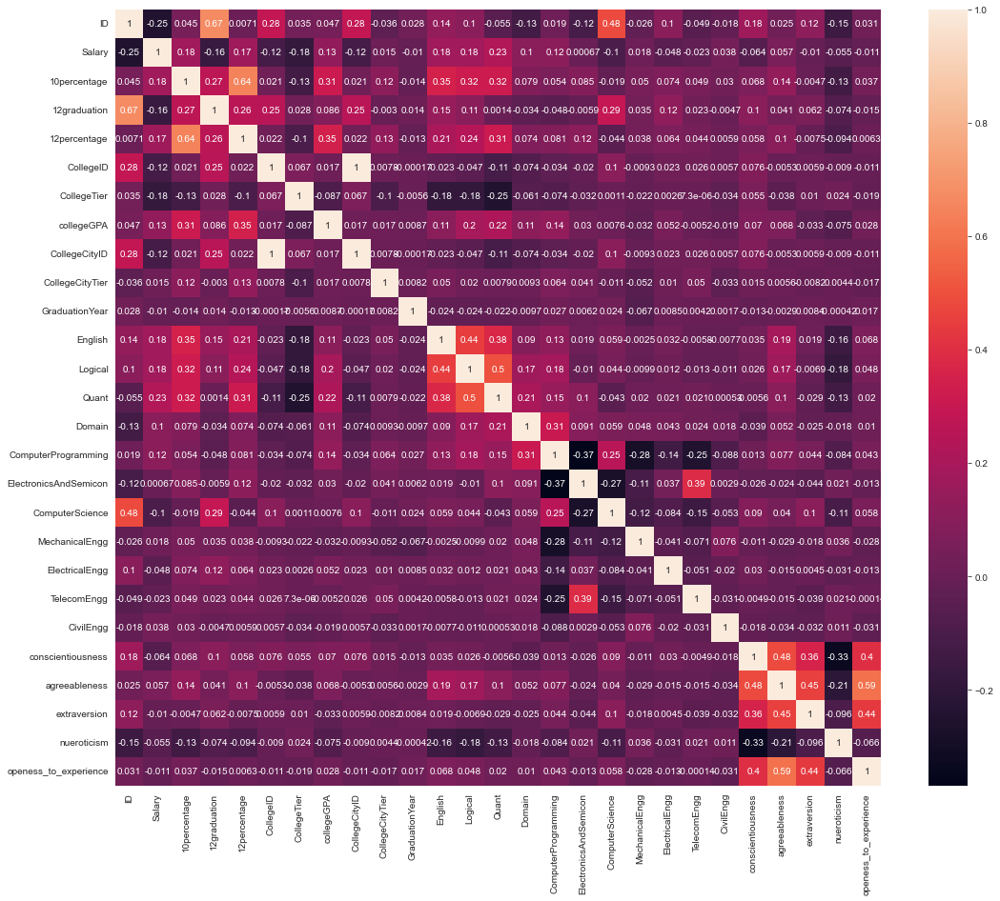

In [100]:
plt.figure(figsize=(18,15))
sns.heatmap(df.corr(), annot=True)
plt.show()

##### Observation : 
${{\cdot}}$ From the heatmap we can see that 10percentage and 12percentage are highly correlated which means if students take good marks in 10board then they will take good marks in 12board also.

${{\cdot}}$ Similarly,English,Quant and Logical subjects are also correlated with each other if student takes good marks in any of one subject then he/she will take good marks in other subjects also.

${{\cdot}}$ conscientiousness and agreeableness are also related.

${{\cdot}}$ extraversion and openess_to_experience are also highly correlated.

#### Correlation using scatter plots

<AxesSubplot:xlabel='10percentage', ylabel='12percentage'>

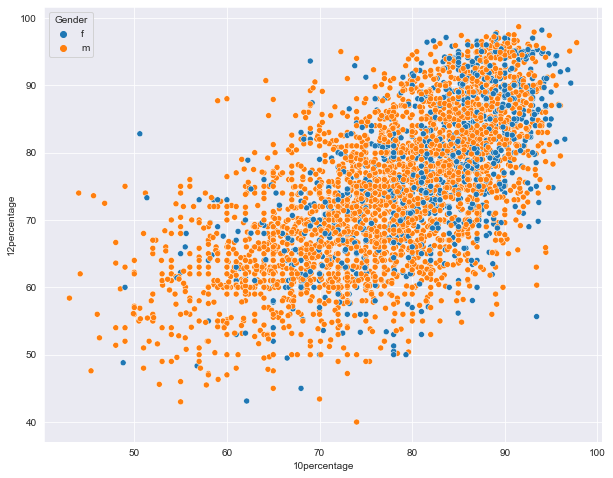

In [101]:
# Relation between 10percentage and 12percentage
plt.figure(figsize=(10,8))
sns.set_style("darkgrid")
sns.scatterplot(data=df,x="10percentage",y="12percentage",hue="Gender")

###### Observation : There is positive correlation between 10percentage and 12percentage.

<AxesSubplot:xlabel='10percentage', ylabel='Salary'>

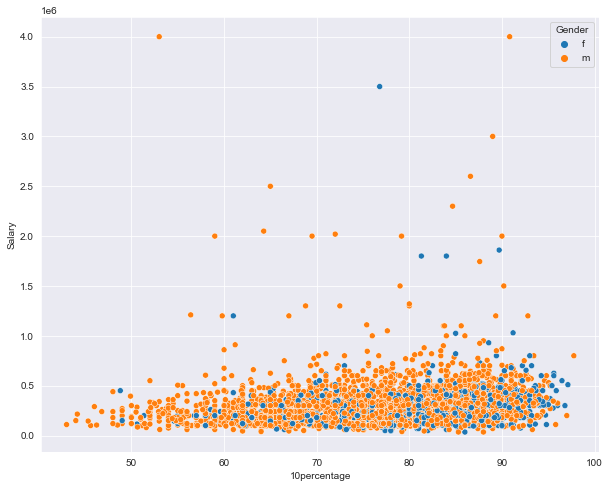

In [102]:
# Relation between Salary and 10percentage
plt.figure(figsize=(10,8))
sns.set_style("darkgrid")
sns.scatterplot(data=df,x="10percentage",y="Salary",hue="Gender")

##### There is no perfect positive correlation but still there is a cluster around x-axis.

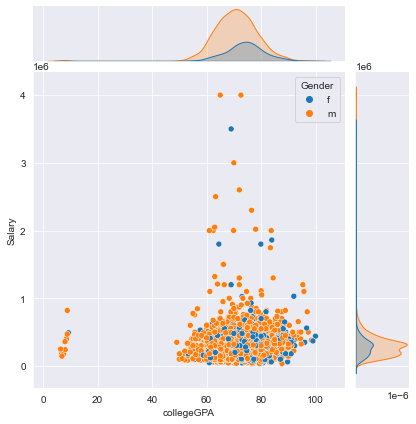

In [103]:
#Relation between Salary and collegeGPA
sns.jointplot(x='collegeGPA', y='Salary', hue="Gender",data=df, kind = 'scatter')

###### Observation : No correlation

#### Checking if Salary by Specialization

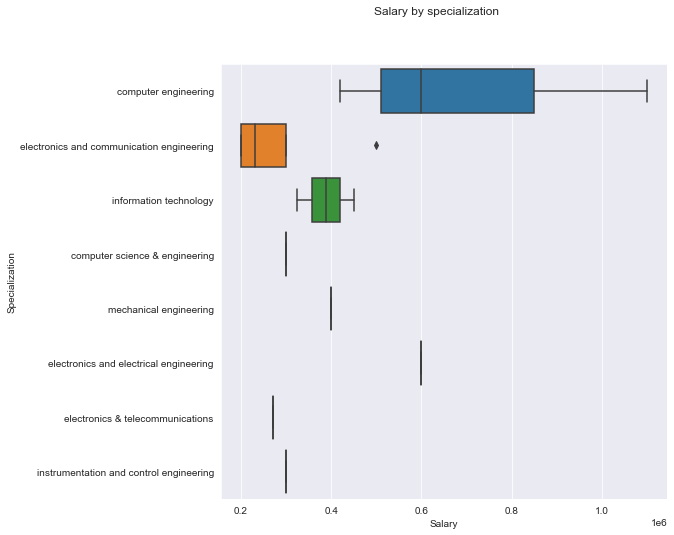

In [104]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.boxplot(x=df['Salary'].iloc[:20], y=df['Specialization'].iloc[:15])
plt.suptitle('Salary by specialization')
plt.show()

##### Relation between ComputerScience and openess_to_experience


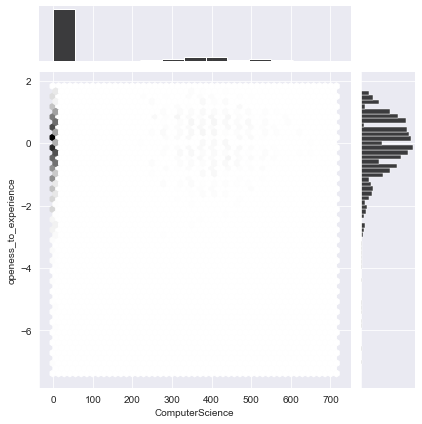

In [105]:
sns.jointplot(x='ComputerScience', y='openess_to_experience', data=df, kind='hex', color='k')

##### Relation with Logical Marks and Gender

<AxesSubplot:xlabel='Gender', ylabel='Logical'>

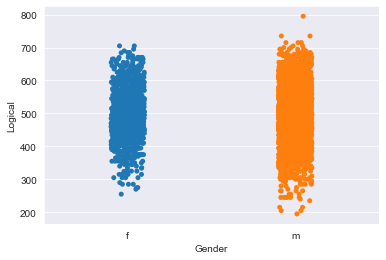

In [106]:
sns.stripplot(data = df, x='Gender', y='Logical')

##### Corrrelation of English and Quant 

<AxesSubplot:xlabel='English', ylabel='Quant'>

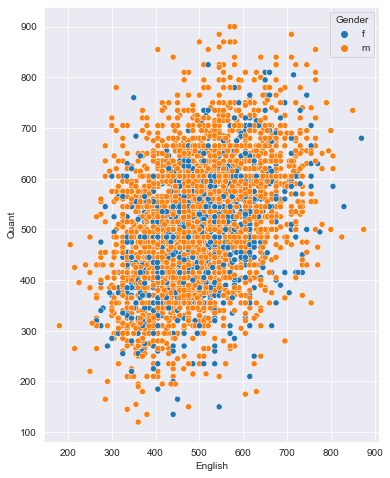

In [107]:
plt.figure(figsize=(6,8))
sns.set_style("darkgrid")
sns.scatterplot(data=df,x="English",y="Quant",hue="Gender")

###### Swarmplot

<AxesSubplot:xlabel='12percentage', ylabel='collegeGPA'>

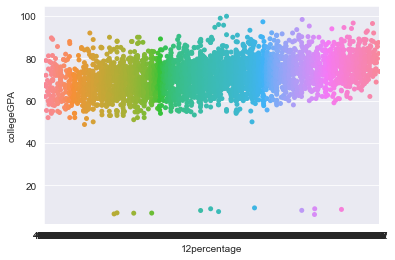

In [108]:
sns.swarmplot(data = df, x='12percentage', y='collegeGPA')

###### Correlation between all the features of dataframe

#### Pairplot for all features

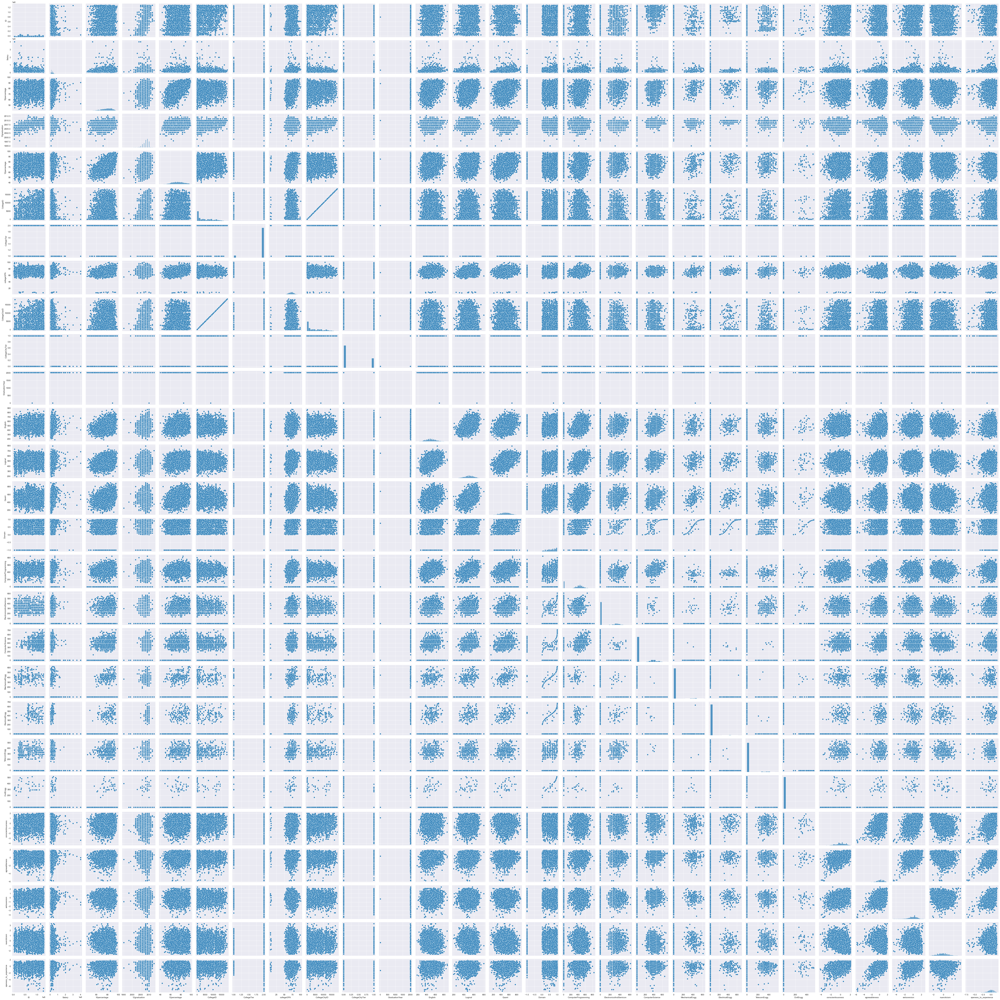

In [109]:
sns.pairplot(df)

##### Feature Transformation

##### Column Standardization using StandardScalar for numeric data

In [110]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [111]:
num = df.select_dtypes(include=['int64', 'float64','int32','int16','float16','float32'])   
df_num = pd.DataFrame(scaler.fit_transform(num),columns = num.columns)
df_num.head()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,0.149066,0.097100,0.754200,0.666667,0.950596,0.061879,1.0,0.765404,0.061879,0.0,...,0.0,0.0,0.0,0.0,0.0,0.833126,0.857931,0.718552,0.666817,0.753438
1,0.441839,0.117276,0.774288,0.666667,0.766610,0.315369,1.0,0.680466,0.315369,0.0,...,0.0,0.0,0.0,0.0,0.0,0.554263,0.801481,0.818421,0.422884,0.895772
2,0.621086,0.073140,0.766983,0.833333,0.480409,0.003368,1.0,0.679825,0.003368,0.0,...,0.0,0.0,0.0,0.0,0.0,0.718474,0.974774,0.667657,0.296022,0.874942
3,0.199065,0.268600,0.777940,0.666667,0.742760,0.375835,0.0,0.729461,0.375835,1.0,...,0.0,0.0,0.0,0.0,0.0,0.681656,0.797044,0.596514,0.372813,0.701917
4,0.258175,0.041614,0.639153,0.722222,0.626917,0.617482,1.0,0.721545,0.617482,0.0,...,0.0,0.0,0.0,0.0,0.0,0.530170,0.715849,0.494822,0.456114,0.787793


In [112]:
from sklearn.preprocessing import StandardScaler
new_df = StandardScaler().fit_transform(df[['ID', 'Salary', '10percentage', '12graduation', '12percentage',
       'CollegeID', 'CollegeTier', 'collegeGPA', 'CollegeCityID',
       'CollegeCityTier', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience']])
new_df

array([[-1.2685353 ,  0.52794734,  0.64723345, ...,  0.55093885,
         1.51265781, -0.30496576],
       [-0.23099069,  0.90404468,  0.75892071, ...,  1.30008288,
         0.06097806,  0.99391015],
       [ 0.40423306,  0.08133175,  0.71830716, ...,  0.16916656,
        -0.69399467,  0.80382107],
       ...,
       [-0.84782375,  0.05782567,  0.39949082, ..., -1.58496779,
        -1.14086388, -0.61847384],
       [ 0.78011472, -0.50632033,  0.08067447, ..., -0.47707134,
        -0.19074569,  0.04346475],
       [-0.93296779,  0.43392301, -0.74378053, ..., -0.6696393 ,
         1.48350511, -0.4617198 ]])

#### Feature Transformation for Categorical Data

In [113]:
# One-hot Encoding of Gender column
dumm_g = pd.get_dummies(df[['Gender']])
dumm_g

,Gender_f,Gender_m
0,1,0
1,0,1
2,1,0
3,0,1
4,0,1
...,...,...
3993,0,1
3994,1,0
3995,0,1
3996,1,0


In [114]:
dumdf = pd.concat([df,dumm_g],axis='columns')
dumdf.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Gender_f,Gender_m
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,...,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455,1,0
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,...,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637,0,1
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,...,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721,1,0
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,...,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194,0,1
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,...,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,0,1


In [115]:
newdf = dumdf.drop(['Gender','Gender_f'],axis='columns')
newdf

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,DOB,10percentage,10board,...,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Gender_m
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,1990-02-19,84.30,"board ofsecondary education,ap",...,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455,0
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,1989-10-04,85.40,cbse,...,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637,1
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,1992-08-03,85.00,cbse,...,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721,0
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,1989-12-05,85.60,cbse,...,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194,1
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,1991-02-27,78.00,cbse,...,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,train,47916,280000,2011-10-01,2012-10-01 00:00:00,software engineer,New Delhi,1987-04-15,52.09,cbse,...,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194,1
3994,train,752781,100000,2013-07-01,2013-07-01 00:00:00,technical writer,Hyderabad,1992-08-27,90.00,state board,...,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943,0
3995,train,355888,320000,2013-07-01,present,associate software engineer,Bangalore,1991-07-03,81.86,"bse,odisha",...,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615,1
3996,train,947111,200000,2014-07-01,2015-01-01 00:00:00,software developer,Asifabadbanglore,1992-03-20,78.72,state board,...,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943,0


##### Feature Transformation of all Categorical Columns

In [116]:
df_dummies = pd.get_dummies(df, prefix='', prefix_sep='', 
                            columns=['Unnamed: 0','Gender','Designation','10board','JobCity','12board','Degree','Specialization','CollegeState'])
df_dummies.head()

,ID,Salary,DOJ,DOL,DOB,10percentage,12graduation,12percentage,CollegeID,CollegeTier,...,Orissa,Punjab,Rajasthan,Sikkim,Tamil Nadu,Telangana,Union Territory,Uttar Pradesh,Uttarakhand,West Bengal
0,203097,420000,2012-06-01,present,1990-02-19,84.3,2007,95.8,1141,2,...,0,0,0,0,0,0,0,0,0,0
1,579905,500000,2013-09-01,present,1989-10-04,85.4,2007,85.0,5807,2,...,0,0,0,0,0,0,0,0,0,0
2,810601,325000,2014-06-01,present,1992-08-03,85.0,2010,68.2,64,2,...,0,0,0,0,0,0,0,1,0,0
3,267447,1100000,2011-07-01,present,1989-12-05,85.6,2007,83.6,6920,1,...,0,0,0,0,0,0,0,0,0,0
4,343523,200000,2014-03-01,2015-03-01 00:00:00,1991-02-27,78.0,2008,76.8,11368,2,...,0,0,0,0,0,0,0,1,0,0


###### Observation : If we see the value of number of columns it is higher than 1000 which means for each categorical column one hot encoding was formed so there is increase column number.

#### Research Questions:

##### Times of India article dated Jan 18, 2019 states that “After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” Test this claim with the data.



#### Hypothesis Testing

In [117]:
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [118]:
# Normalize Salary for Better Visualization
df['n_sal']=df['Salary']/100000

In [119]:
df[['Designation','Specialization']][df['Designation']=='hardware engineer']

,Designation,Specialization
197,hardware engineer,electrical engineering
802,hardware engineer,electronics and communication engineering
839,hardware engineer,electronics and communication engineering
1886,hardware engineer,electronics and communication engineering
2070,hardware engineer,electronics and communication engineering
2533,hardware engineer,electronics and communication engineering
3438,hardware engineer,electronics engineering
3547,hardware engineer,electronics and communication engineering


In [120]:
print('Average Salary :')
print('Programmer Analyst :',round(df['n_sal'][(df['GraduationYear']==2014) & (df['Designation']=='programmer analyst') & (df['Specialization']=='computer science & engineering')].mean(), 2))
print('Software Engineer :',round(df['n_sal'][(df['GraduationYear']==2014) & (df['Designation']=='software engineer')  & (df['Specialization']=='computer science & engineering')].mean(),2))
print('Hardware Engineer :',round(df['n_sal'][(df['GraduationYear']==2014) &(df['Designation']=='hardware engineer')  & (df['Specialization']=='computer science & engineering')].mean(), 2))
print('Associate Engineer :',round(df['n_sal'][(df['GraduationYear']==2014) &(df['Designation']=='associate engineer')  & (df['Specialization']=='computer science & engineering')].mean(), 2))

Average Salary :
Programmer Analyst : 3.02
Software Engineer : 3.4
Hardware Engineer : nan
Associate Engineer : 3.33


In [121]:
# Sample Data for Required Employees
sample = [3.16,3.6,0,3.5]
sample = np.array(sample)

In [122]:
# Necessary variables initialization ex- sample mean
s_size = len(sample)
s_mean = np.mean(sample)
s_mean

2.565

In [123]:
# Sample Standard Devation
import math
s_std = math.sqrt(sum([(i-s_mean)**2 for i in sample]) / 3)
print('Sample Standard Deviation :', s_std)

Sample Standard Deviation : 1.7203391138571102


In [124]:
# Calulating T-Score
def t_score(pop_mean, s_mean, s_std, s_size):
    xX = s_mean - pop_mean
    sigma = s_std / (s_size**0.5)
    return xX / sigma

In [125]:
# Necessary variables initialization ex- sample mean,population mean
pop_mean = 2.75
s_mean = 3.34
s_std = 0.21
s_size = 4

In [126]:
# Calling T-score Function
t_sc = t_score(pop_mean, s_mean, s_std, s_size)
print('t-score :', t_sc)

t-score : 5.619047619047618


In [127]:
# Setting the Confidence Level

# Two Tail - Deciding the Significance Level & Calculating the t-critical value
from scipy.stats import t
confidence_level = 0.95
alpha = 1 - confidence_level
t_critical = t.ppf(1-alpha/2, df = 3)
print('t_critical :', t_critical)

t_critical : 3.182446305284263


t_critical_left : 2.4158431379451524
t_critical_right : 3.0841568620548476


Text(3.34, 0.1, 'x_bar')

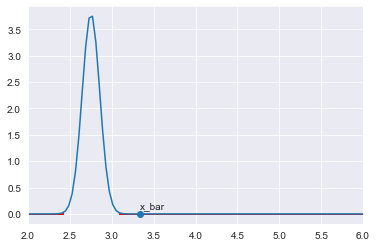

In [128]:
# Visualizing the Sampling Distribution with Rejection Regions
from scipy.stats import norm
# Defining the x min & x max
x_min = 2
x_max =6

# Defining the Sampling Distribution mean & std
mean = pop_mean
std = s_std / (s_size**0.5)

# Ploting the graph and setting the x limits
x = np.linspace(x_min, x_max, 100)
y = norm.pdf(x, mean, std)
plt.xlim(x_min, x_max)
plt.plot(x, y)

# Computing the left and right critical values of Two tailed Test
t_critical_left = pop_mean + (-t_critical * std)
t_critical_right = pop_mean + (t_critical * std)

print('t_critical_left :', t_critical_left)
print('t_critical_right :', t_critical_right)

# Shading the left rejection region
x_left = np.linspace(x_min, t_critical_left, 100)
y_left = norm.pdf(x_left, mean, std)
plt.fill_between(x_left, y_left, color='red')

# Shading the right rejection region
x_right = np.linspace(t_critical_right, x_max, 100)
y_right = norm.pdf(x_right, mean, std)
plt.fill_between(x_right, y_right, color='red')

plt.scatter(s_mean, 0)
plt.annotate("x_bar", (s_mean, 0.1))

In [129]:
# Compairing the Table Value and T-score value

# Conclusion using t-test

if np.abs(t_sc) > t_critical:
    print("Reject Null Hypothesis")
else:
    print("Fail to reject Null Hypothesis")

Reject Null Hypothesis


In [130]:
# Conclusion using p-test
p_value = 2 * (1.0 - norm.cdf(np.abs(t_sc)))

print("p_value = ", p_value)

if p_value < alpha:
    print("Reject Null Hypothesis")
else:
    print("Fail to reject Null Hypothesis")

p_value =  1.9201293444126577e-08
Reject Null Hypothesis


#### Relation between Gender and Specialization


<AxesSubplot:xlabel='Gender', ylabel='Specialization'>

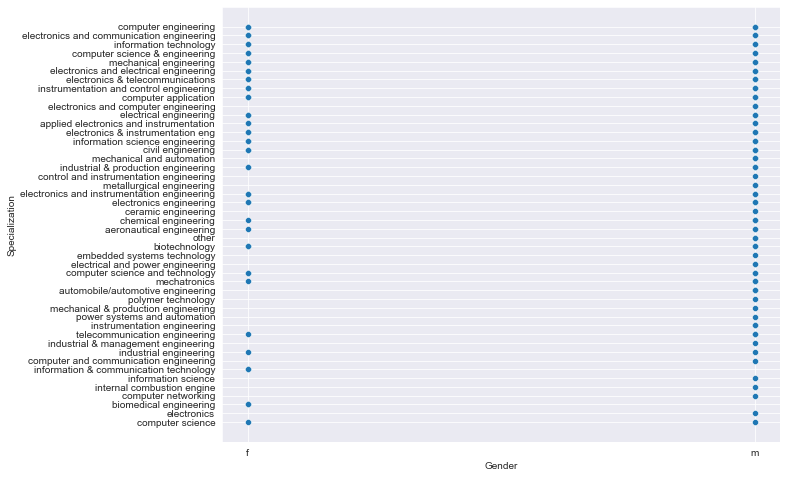

In [131]:
plt.figure(figsize=(10,8))
sns.set_style("darkgrid")
sns.scatterplot(data=df,x="Gender",y="Specialization")

##### There is no correlation between Gender and Specialization

### CONCLUSION :
#### The given dataset was about job given to a candidate with his/her salary and resume details known to us and analysing how all other stream candidates got job with salary.We found outliers,pdf,frequency distribution in univariate analysis with many visualization technique like scatterplots,boxplot,countplot,histogram etc
#### Bivariate analysis was about correlation between numeric columns and between numeric and categorical columns where we have used many visualization techniques like scatterplots,heatmap,swarmplot,etc.
#### Case study of Times of India report 2015 where we rejected null hypothesis which means the given data matches with the assumption of being True
#### Feature Transformation of columns.
#### Please note that I have kept all columns intact because we weren't ask to do datacleaning only visualization part 
#### If data cleaning was asked then Unnamed: 0 column is not needed we could have dropped it and some other columns like collegecityID,cityID,ID are also not required.
#### And -1 values present in some columns should have to be taken care.

In [132]:
# We can drop some unneccessary columns to keep our dataset clean
df.drop(['Unnamed: 0','ID','10board','12board','CollegeID','CollegeCityID'],axis=1,inplace=True)
df.head()

,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,12graduation,12percentage,...,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,n_sal
0,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,2007,95.8,...,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455,4.20
1,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,2007,85.0,...,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637,5.00
2,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,2010,68.2,...,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721,3.25
3,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,2007,83.6,...,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194,11.00
4,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,2008,76.8,...,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,2.00


### THANK YOU